In [177]:
import numpy as np
import pandas as pd
from scipy.sparse import csr_matrix, hstack
from scipy.io import mmread, mmwrite
import matplotlib.pyplot as plt
# from scipy import sparse
import plotly.express as px
import random
import math
import seaborn as sns
from plotly import graph_objects as go

# North-South UK
## This is Wins Conc on v5 (GB) data

In [178]:
df = pd.read_csv("animationDataUK.csv")

In [179]:
df = df.drop(columns=(["LAD1_2", "LAD3_4"]))

### Need to assign each LAD to either North or South

Use the region to say:
East of England, South West, South East, and London constitute 'South'.

In [180]:
LAD_Region_lookup = pd.read_csv("LAD_Region_lookup_UK.csv")

In [181]:
df = df.merge(LAD_Region_lookup, left_on="LAD", right_on="LAD11NM", how="left")

In [182]:
df["NorthIndicator"] = np.where( (df["RGN11NM"] == "South West") | (df["RGN11NM"] == "London") | (df["RGN11NM"] == "South East") | (df["RGN11NM"] == "East of England"), 0, 1) 

In [183]:
df = df.rename(columns={"LAD_x": "LAD"})
df = df.drop(columns=(["LAD_y", "Unnamed: 0_x","Unnamed: 0_y", "LAD11NM"]))

In [184]:
df

,dim1,dim2,dim3,dim4,year,Xscaled,Yscaled,LAD,col,index,LAD11CD,RGN11CD,RGN11NM,NorthIndicator
0,-0.105363,0.122562,-0.114425,0.000447,2005,0.801441,0.145821,Westminster,#CC3325,179,E09000033,E12000007,London,0
1,-0.073963,0.052386,-0.028679,0.033804,2005,0.811587,0.142026,Southwark,#CF3324,321,E09000028,E12000007,London,0
2,-0.053944,-0.010100,-0.019761,0.036238,2005,0.797883,0.144591,Kensington and Chelsea,#CB3325,297,E09000020,E12000007,London,0
3,-0.058557,0.002777,-0.007625,0.024068,2005,0.815852,0.146336,Tower Hamlets,#D03325,171,E09000030,E12000007,London,0
4,-0.069387,0.041780,-0.044376,0.038869,2005,0.604415,0.238420,Birmingham,#9A333D,7,E08000025,E12000005,West Midlands,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2275,-0.010420,0.005661,-0.016960,0.002911,2010,0.906859,0.166521,Maldon,#E7332A,103,E07000074,E12000006,East of England,0
2276,-0.008877,0.002134,-0.002159,-0.014391,2010,0.665984,0.228549,Rugby,#AA333A,128,E07000220,E12000005,West Midlands,1
2277,-0.013094,-0.008126,0.003387,-0.002420,2010,0.732592,0.121878,Rushmoor,#BB331F,208,E07000092,E12000008,South East,0
2278,-0.005880,-0.001852,0.004244,-0.006805,2010,0.835111,0.149328,Barking and Dagenham,#D53326,228,E09000002,E12000007,London,0


# 05/01/2023, making a LAD to North or South lookup, for colouring points in plots in R
# This csv is copied from 15 to 18 in folders 
test = df[df['year']==2005]
test = test[['LAD11CD', 'LAD', 'NorthIndicator']]

test

test.to_csv("LAD_NorthIndicator_GB_lookup.csv")

In [186]:
# how many LADs are in the north
n = df[(df["year"]==2005) & (df["NorthIndicator"]==1)].shape[0]
# how many LADs are in the south
s = df[(df["year"]==2005) & (df["NorthIndicator"]==0)].shape[0]

print([n,s])

[196, 184]


In [187]:
d = 4 # we chose this from the scree plots

years = df["year"].unique()
earlyYears = years[0:3] # 2005-2007
lateYears = years[3:6]  # 2008-2010

In [188]:
mean_diff_early = []
mean_diff_late = []

In [189]:
# make a column that is 1 if the year is an "early year"
df["EarlyIndicator"] = np.where( (df["year"] == earlyYears[0]) | (df["year"] == earlyYears[1]) | (df["year"] == earlyYears[2]), 1, 0) 
earlyNorthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 1) ]
earlySouthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 0) ]
lateNorthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 1) ]
lateSouthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 0) ]

In [190]:
# calculate values of mean_diff_early_i for all i, i.e. all PCs, and store them in order in a vector
# same for mean_diff_late_i

for i in range(0,d):
    valEarly = (1/3*n) * sum( earlyNorthdf.iloc[: ,i])  -  (1/3*s) * sum( earlySouthdf.iloc[: ,i])
    valLate = (1/3*n) * sum( lateNorthdf.iloc[: ,i])  -  (1/3*s) * sum( lateSouthdf.iloc[: ,i])
    mean_diff_early.append(valEarly)
    mean_diff_late.append(valLate)

In [191]:
# calculate T_PC_i
T_PC = np.subtract(mean_diff_early, mean_diff_late)

# length d vector of the subtracted values
T_PC

array([ -36.15541647,  -56.48849493,  -54.35901652, -162.88515337])

In [192]:
T_full_obs = sum(T_PC**2) # this is T_obs
T_obs = T_full_obs # incase I type wrong thing
T_full_obs

33984.64006360277

#### Permute assignments of LADs into before/after independently

If the null hypothesis says that time doesn't matter, the labelling of columns into positions shouldn't matter. So we can permute the assignments.
Each LAD is counted exactly 3 times in the early/late groups, which we might label A and B when permuting to avoid confusion. Which groups the LADs columns are assigned to are done **independently** for each LAD.

In [193]:
ladslist = pd.read_csv("LADS_list_UK.csv", header=None)

ladslist = ladslist[1]
ladslist = list(ladslist)
ladslist = ladslist[1:] # removes a 0 as the first list entry
len(ladslist)

380

#### Put it all together in a loop that iterates P times, and stores P items in a `T_full_p_list` item. 

In [194]:
rand_ones = np.array([0,0,0,1,1,1])
df["A_indicator"] = 0

T_full_p_list = []
P = 5000

# for the individual PCs
T_PC_p_table = pd.DataFrame(columns=['dim1','dim2','dim3','dim4'])

The cell below takes ~5mins to run when $p=5000$.

In [195]:
summariesdf = pd.DataFrame()


for p in range(P):

    for lad in ladslist:
        # to pick 3 timepoints at random for group A
        random.shuffle(rand_ones)
        # populates the "A_indicator" column
        df.loc[df["LAD"] == lad,"A_indicator"] = rand_ones

# split the data into the 4 groups (made up of 2 binary labels, 2*2 = 4)
    A_Northdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 1) ]
    A_Southdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 0) ]
    B_Northdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 1) ]
    B_Southdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 0) ]
    
    ### THIS STUFF IS TO CONSTRUCT CONFIDENCE INTERVALS
    A_North_summaries = [np.mean(A_Northdf['dim1']) , np.mean(A_Northdf['dim2']) , np.mean(A_Northdf['dim3']) , np.mean(A_Northdf['dim4'])]
    A_South_summaries = [np.mean(A_Southdf['dim1']) , np.mean(A_Southdf['dim2']) , np.mean(A_Southdf['dim3']) , np.mean(A_Southdf['dim4'])]
    B_North_summaries = [np.mean(B_Northdf['dim1']) , np.mean(B_Northdf['dim2']) , np.mean(B_Northdf['dim3']) , np.mean(B_Northdf['dim4'])]
    B_South_summaries = [np.mean(B_Southdf['dim1']) , np.mean(B_Southdf['dim2']) , np.mean(B_Southdf['dim3']) , np.mean(B_Southdf['dim4'])]
    summaries = pd.DataFrame (A_North_summaries, columns = ['A_North'])
    summaries['A_South'] = A_South_summaries
    summaries['B_North'] = B_North_summaries
    summaries['B_South'] = B_South_summaries
    summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])
    summaries = summaries.transpose()
    summaries['NorthIndicator'] = [1,0,1,0]
    summaries['NorthorSouth'] = np.where(summaries['NorthIndicator'] >0, 'North', 'South')
    summaries['A_Indicator'] = [1,1,0,0]
    summaries['AorB'] = np.where(summaries['A_Indicator'] >0, 'A', 'B')
    summaries['permutation'] = p
    summariesdf = pd.concat([summariesdf, summaries], axis=0)


    # length d vectors of the difference between the mean locations of the North and South for the 2 groups, A and B 
    mean_diff_A_p = []  #A is early, B is late
    mean_diff_B_p = []
    # calculate values of mean_diff_A_i for all i, i.e. all PCs, and store them in order in a vector
    # same for mean_diff_B_i
    for i in range(0,d):
        valA = (1/3*n) * sum( A_Northdf.iloc[: ,i])  -  (1/3*s) * sum( A_Southdf.iloc[: ,i])
        valB = (1/3*n) * sum( B_Northdf.iloc[: ,i])  -  (1/3*s) * sum( B_Southdf.iloc[: ,i])
        mean_diff_A_p.append(valA)
        mean_diff_B_p.append(valB)

    # calculate T_PC_i_p
    T_PC_p = np.subtract(mean_diff_A_p, mean_diff_B_p)

    T_full_p = sum(T_PC_p**2) # this is T_obs

    # values for all dimensions statistic 
    T_full_p_list.append(T_full_p)
    
    # values for individual dimension statistic
    T_PC_p_table.loc[p,:] = T_PC_p

In [196]:
counter = 0
for p in range(P):
    if T_full_p_list[p] > T_obs:
        counter += 1
    else: 
        counter = counter

In [197]:
# how many of the P permutations had a distance larger than T_obs
counter

6

p-value for testing change across all dimensions:

In [198]:
# because we consider:
# p-value = (1/(P+1)) #test statistics >= T_obs 
# where T_obs and T_p are all considered.
(counter+1)/(P+1)

0.0013997200559888023

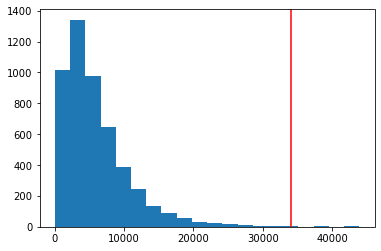

In [199]:
plt.hist(T_full_p_list, bins=20)
plt.axvline(T_obs,color='red')

This is across all d=4 embedding dimensions. We should split this out now to have 4 T_obs, one for each PC, and then get P replicates of T_PC_i

#### Testing if time matters in each of the 4 dimensions independently
I think we can do this as the dimensions are orthogonal

In [200]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table.iloc[p , dim] > T_PC[dim]:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value
PC_p_values

[0.9186162767446511, 0.8930213957208558, 0.9124175164967007, 1.0]

In [201]:
# can square all the values in the `T_PC_p_table` table.
# This is to say we are looking at the value of   (mean_diff_A_p_i - mean_diff_B_p_i)**2
# when we look at row p, column i in the table

T_PC_p_table_squared = T_PC_p_table**2 # #square every value in df

Histograms for *mean_diff_A_p_i - mean_diff_B_p_i*, where there is a plot for each `i` (the dimension), and `P` counts. 

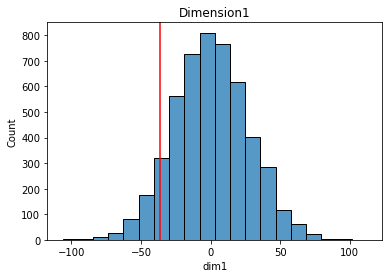

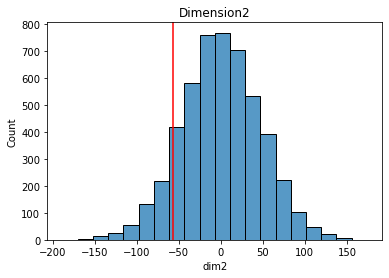

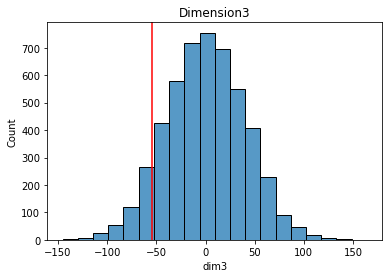

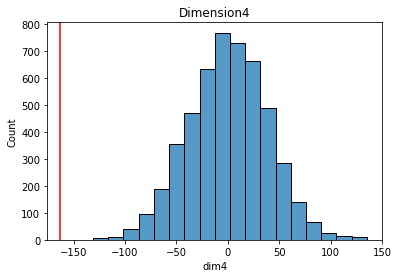

In [202]:
for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table.iloc[:,dim], bins=20)
    plt.axvline(T_PC[dim], color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

### Histograms for *(mean_diff_A_p_i - mean_diff_B_p_i)$^2$*, where there is a plot for each `i` (the dimension), and `P` counts. 

In [203]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table_squared.iloc[p , dim] > (T_PC[dim])**2:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_square_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value

# p-values for each dimension
PC_p_square_values

[0.1767646470705859,
 0.21855628874225155,
 0.17356528694261147,
 0.0001999600079984003]

Tells us at the 5% significance level, we can see that only a significant change for PC4 in that we see a change between the 
**early** years (2005-2007) and the **late** years (2008-2010).

* PC3 is latitude (East-West)
* PC4 is longitude (North-South)

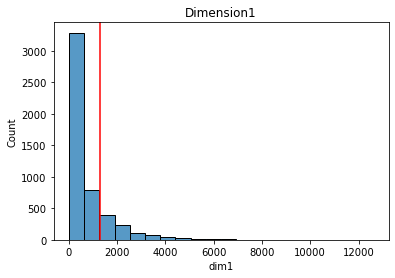

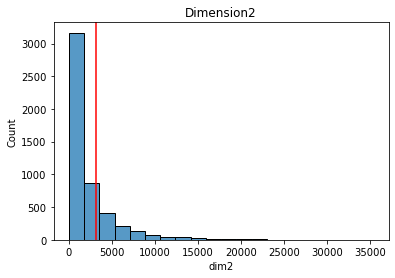

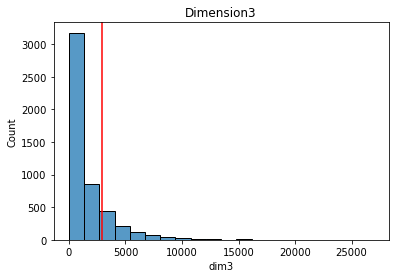

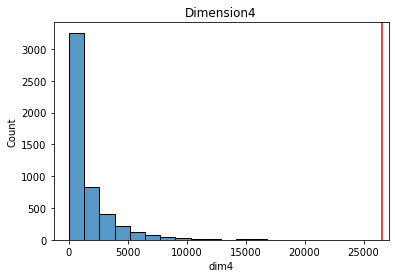

In [204]:
# squared values of distance between mean diff in groups A and B

for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table_squared.iloc[:,dim], bins=20)
    plt.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

In [205]:
# for dim in range(d):
#     f, ax = plt.subplots()
#     ax = sns.kdeplot(T_PC_p_table_squared.iloc[:,dim] , clip=(0.0, 10000))
#     plt.axvline( (T_PC[dim])**2 , color="red")
#     ax.set_title("Dimension{}".format(dim+1))
    
#     fig = ax.get_figure()

#     fig.savefig("pvalueDensityPlots_Dim{}.pdf".format(dim+1))

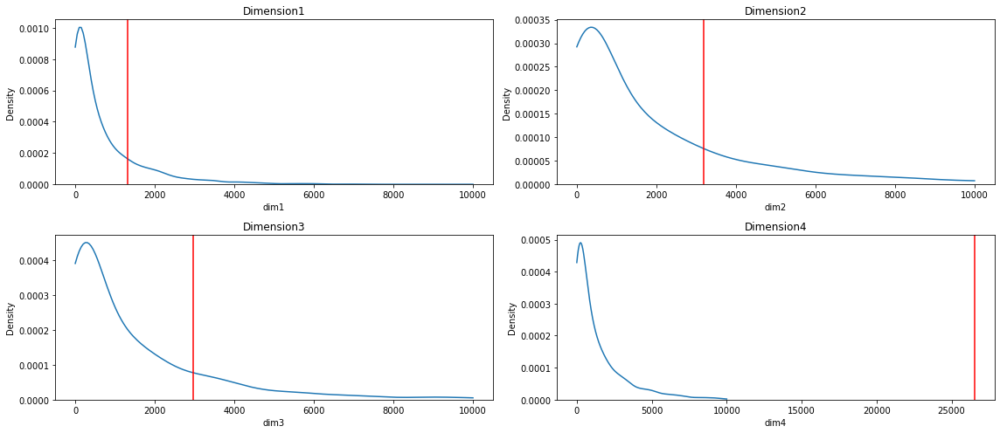

In [206]:
fig, axes = plt.subplots(2,2, figsize=(16,7))

for dim, ax in enumerate(axes.ravel()):
    sns.kdeplot(T_PC_p_table_squared.iloc[:,dim] , clip=(0.0, 10000), ax=ax)
    ax.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
fig.tight_layout()    

fig.savefig("pvalueDensityPlots_UK.pdf")

### Plots and Summary Statistics
06/10/2022

In [207]:
# north is east, south is west
earlyNorth_summaries = [np.mean(earlyNorthdf['dim1']) , np.mean(earlyNorthdf['dim2']) , np.mean(earlyNorthdf['dim3']) , np.mean(earlyNorthdf['dim4'])]
earlySouth_summaries = [np.mean(earlySouthdf['dim1']) , np.mean(earlySouthdf['dim2']) , np.mean(earlySouthdf['dim3']) , np.mean(earlySouthdf['dim4'])]
lateNorth_summaries = [np.mean(lateNorthdf['dim1']) , np.mean(lateNorthdf['dim2']) , np.mean(lateNorthdf['dim3']) , np.mean(lateNorthdf['dim4'])]
lateSouth_summaries = [np.mean(lateSouthdf['dim1']) , np.mean(lateSouthdf['dim2']) , np.mean(lateSouthdf['dim3']) , np.mean(lateSouthdf['dim4'])]

In [208]:
summaries = pd.DataFrame (earlyNorth_summaries, columns = ['earlyNorth'])
summaries['earlySouth'] = earlySouth_summaries
summaries['lateNorth'] = lateNorth_summaries
summaries['lateSouth'] = lateSouth_summaries

summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])

summaries = summaries.transpose()

summaries['NorthIndicator'] = [1,0,1,0]
# changed northorsouth to eastorwest
summaries['NorthorSouth'] = np.where(summaries['NorthIndicator'] >0, 'North', 'South')
summaries['EarlyIndicator'] = [1,1,0,0]
summaries['EarlyorLate'] = np.where(summaries['EarlyIndicator'] >0, 'Early', 'Late')

In [209]:
summariesdf

,dim1,dim2,dim3,dim4,NorthIndicator,NorthorSouth,A_Indicator,AorB,permutation
A_North,-0.013524,0.001693,0.010980,0.004405,1,North,1,A,0
A_South,-0.018469,-0.009824,0.000004,-0.009261,0,South,1,A,0
B_North,-0.013555,0.000080,0.010856,0.005435,1,North,0,B,0
B_South,-0.018587,-0.009828,-0.001157,-0.009493,0,South,0,B,0
A_North,-0.013524,0.001012,0.010992,0.004936,1,North,1,A,1
...,...,...,...,...,...,...,...,...,...
B_South,-0.018054,-0.009794,-0.000495,-0.009050,0,South,0,B,4998
A_North,-0.013537,0.001656,0.011122,0.005315,1,North,1,A,4999
A_South,-0.018912,-0.009565,-0.000493,-0.009087,0,South,1,A,4999
B_North,-0.013543,0.000117,0.010714,0.004524,1,North,0,B,4999


In [210]:
summariesdf['ABNorthSouth'] = summariesdf['NorthorSouth'] + summariesdf['AorB'] 

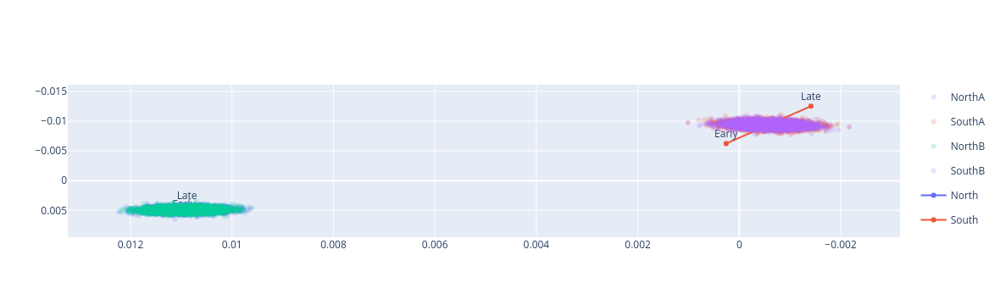

[48521:0106/113056.945811:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [211]:
fig1 = px.scatter(summariesdf, x="dim3", y="dim4",
                 color ="ABNorthSouth", opacity=0.2,
                 height=500, width=500)

fig2 = px.line(summaries, x='dim3', y='dim4', 
              color='NorthorSouth', markers=True,
              text='EarlyorLate',
                hover_data=['NorthorSouth', 'EarlyorLate'])

fig2.update_traces(textposition='top center')


fig3 = go.Figure(data=fig1.data + fig2.data)
fig3.update_xaxes(range = [max(summariesdf["dim3"])+0.001, min(summariesdf["dim3"])-0.001] )
fig3.update_yaxes(range = [max(summariesdf["dim4"])+0.003, min(summariesdf["dim4"])-0.005 ])
fig3.show()

fig3.write_image("NorthSouth_earlyLate_PC3_4_permPoints_UK.pdf")

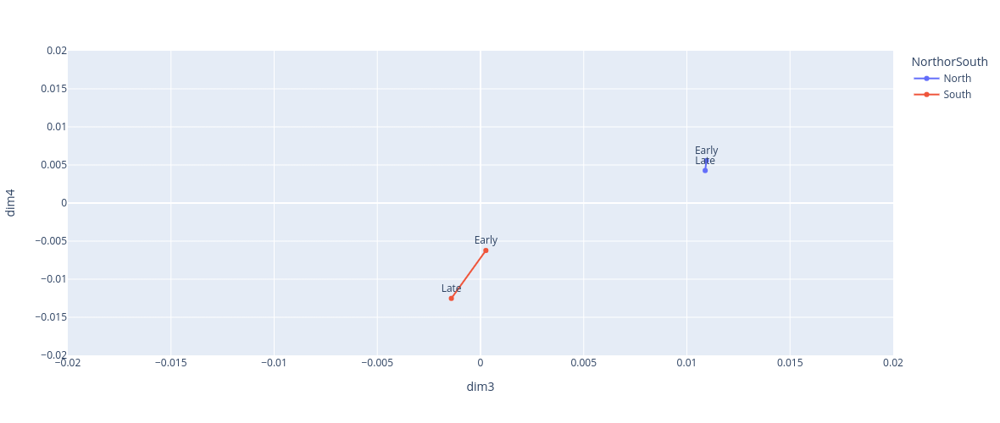

In [212]:
fig = px.line(summaries, x='dim3', y='dim4', 
              color='NorthorSouth', markers=True,
              text='EarlyorLate',
                hover_data=['NorthorSouth', 'EarlyorLate'],
             width=500, height=500)

fig.update_traces(textposition='top center')

# fig.add_annotation(x=summaries.loc['earlyNorth','dim3'], y=summaries.loc['earlyNorth','dim4'], text="Early North")
# fig.add_annotation(x=summaries.loc['earlySouth','dim3'], y=summaries.loc['earlySouth','dim4'], text="Early South")
# fig.add_annotation(x=summaries.loc['lateNorth','dim3'], y=summaries.loc['lateNorth','dim4'], text="Late North")
# fig.add_annotation(x=summaries.loc['lateSouth','dim3'], y=summaries.loc['lateSouth','dim4'], text="Late South")

fig.update_layout(yaxis_range=[-0.02,0.02])
fig.update_layout(xaxis_range=[-0.02,0.02])
fig.show()

In [213]:
fig.write_image("NorthSouth_earlyLate_PC3_4_UK.pdf")

[48521:0106/113057.766053:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


#### Other way round lines, i.e. distances that are T_i_obs

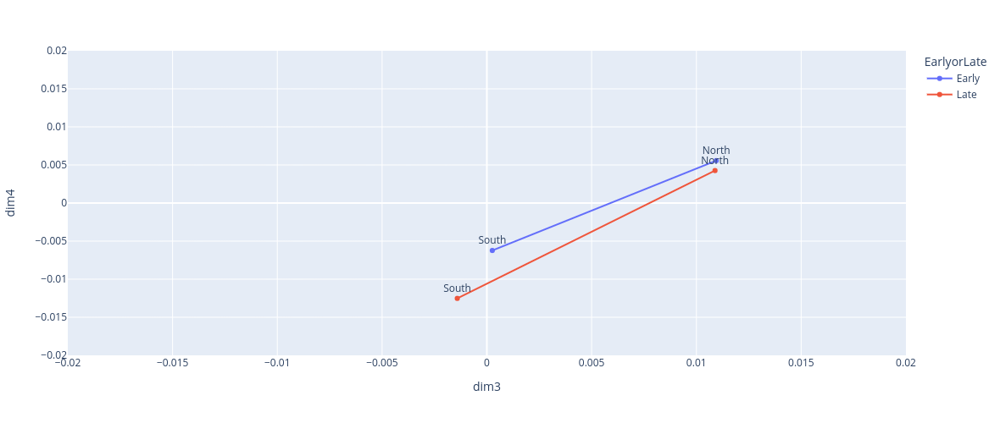

[48521:0106/113058.081285:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [214]:
fig = px.line(summaries, x='dim3', y='dim4', 
              color='EarlyorLate', markers=True,
              text='NorthorSouth',
                hover_data=['NorthorSouth', 'EarlyorLate'],
             width=500, height=500)

fig.update_traces(textposition='top center')

# fig.add_annotation(x=summaries.loc['earlyNorth','dim3'], y=summaries.loc['earlyNorth','dim4'], text="Early North")
# fig.add_annotation(x=summaries.loc['earlySouth','dim3'], y=summaries.loc['earlySouth','dim4'], text="Early South")
# fig.add_annotation(x=summaries.loc['lateNorth','dim3'], y=summaries.loc['lateNorth','dim4'], text="Late North")
# fig.add_annotation(x=summaries.loc['lateSouth','dim3'], y=summaries.loc['lateSouth','dim4'], text="Late South")

fig.update_layout(yaxis_range=[-0.02,0.02])
fig.update_layout(xaxis_range=[-0.02,0.02])
fig.show()

fig.write_image('earlyLate_NorthSouth_PC3_4_UK.pdf')

In [215]:
summariesarray = summariesdf.to_numpy()

In [216]:
summaries_earlyLate_array = summaries.to_numpy()

The north and south always occupy different spaces in the dimension 4, but move further apart when we go from early to late. 

In [217]:
(summariesarray[0,2:4], summariesarray[1,2:4])


(array([0.010979854559950184, 0.0044045457681048976], dtype=object),
 array([3.871037703479899e-06, -0.009261309206348633], dtype=object))

In [218]:
# Construct confidence intervals for changes in dimensions

Qdf = pd.DataFrame()
TEMP = pd.DataFrame()

A_North_forQdf = summariesdf.loc["A_North"]
A_South_forQdf = summariesdf.loc["A_South"]
B_North_forQdf = summariesdf.loc["B_North"]
B_South_forQdf = summariesdf.loc["B_South"]

for i in range(4):
    TEMP['dim{}'.format(i+1)] = (pd.DataFrame(A_North_forQdf.iloc[:,i].quantile(q=[0.05, 0.95])))
TEMP['info'] = "A_North"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}'.format(i+1)] = (pd.DataFrame(A_South_forQdf.iloc[:,i].quantile(q=[0.05, 0.95])))
TEMP['info'] = "A_South"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}'.format(i+1)] = (pd.DataFrame(B_North_forQdf.iloc[:,i].quantile(q=[0.05, 0.95])))
TEMP['info'] = "B_North"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}'.format(i+1)] = (pd.DataFrame(B_South_forQdf.iloc[:,i].quantile(q=[0.05, 0.95])))
TEMP['info'] = "B_South"
Qdf = pd.concat([Qdf,TEMP])
    

In [219]:
# MODIFIED
# Construct confidence intervals for changes in dimensions

summaries_copy = summaries

Qdf = pd.DataFrame()
TEMP = pd.DataFrame()

A_North_forQdf = summariesdf.loc["A_North"]
A_South_forQdf = summariesdf.loc["A_South"]
B_North_forQdf = summariesdf.loc["B_North"]
B_South_forQdf = summariesdf.loc["B_South"]

for i in range(4):
    TEMP['dim{}_95'.format(i+1)] = (pd.DataFrame(A_North_forQdf.iloc[:,i].quantile(q=[0.95])))
TEMP['info'] = "A_North"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}_95'.format(i+1)] = (pd.DataFrame(A_South_forQdf.iloc[:,i].quantile(q=[0.95])))
TEMP['info'] = "A_South"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}_95'.format(i+1)] = (pd.DataFrame(B_North_forQdf.iloc[:,i].quantile(q=[0.95])))
TEMP['info'] = "B_North"
Qdf = pd.concat([Qdf,TEMP])

for i in range(4):
    TEMP['dim{}_95'.format(i+1)] = (pd.DataFrame(B_South_forQdf.iloc[:,i].quantile(q=[0.95])))
TEMP['info'] = "B_South"
Qdf = pd.concat([Qdf,TEMP])
    

In [220]:
# MODIFIED
# Construct confidence intervals for changes in dimensions

Qdf_below = pd.DataFrame()
TEMP = pd.DataFrame()

A_North_forQdf = summariesdf.loc["A_North"]
A_South_forQdf = summariesdf.loc["A_South"]
B_North_forQdf = summariesdf.loc["B_North"]
B_South_forQdf = summariesdf.loc["B_South"]

for i in range(4):
    TEMP['dim{}_5'.format(i+1)] = (pd.DataFrame(A_North_forQdf.iloc[:,i].quantile(q=[0.05])))
TEMP['info'] = "A_North"
Qdf_below = pd.concat([Qdf_below,TEMP])

for i in range(4):
    TEMP['dim{}_5'.format(i+1)] = (pd.DataFrame(A_South_forQdf.iloc[:,i].quantile(q=[0.05])))
TEMP['info'] = "A_South"
Qdf_below = pd.concat([Qdf_below,TEMP])

for i in range(4):
    TEMP['dim{}_5'.format(i+1)] = (pd.DataFrame(B_North_forQdf.iloc[:,i].quantile(q=[0.05])))
TEMP['info'] = "B_North"
Qdf_below = pd.concat([Qdf_below,TEMP])

for i in range(4):
    TEMP['dim{}_5'.format(i+1)] = (pd.DataFrame(B_South_forQdf.iloc[:,i].quantile(q=[0.05])))
TEMP['info'] = "B_South"
Qdf_below = pd.concat([Qdf_below,TEMP])

In [221]:
Qdf_below = Qdf_below.reset_index()
Qdf = Qdf.reset_index()

In [222]:
# Qdf

In [223]:
summaries_copy = summaries_copy.reset_index()

In [224]:
# summaries_copy

In [225]:
comb_df = pd.concat([summaries_copy, Qdf],axis=1)
comb_df = pd.concat([comb_df, Qdf_below],axis=1)

In [226]:
# comb_df

In [227]:
comb_df.to_csv('CIplottingdf_UK.csv')

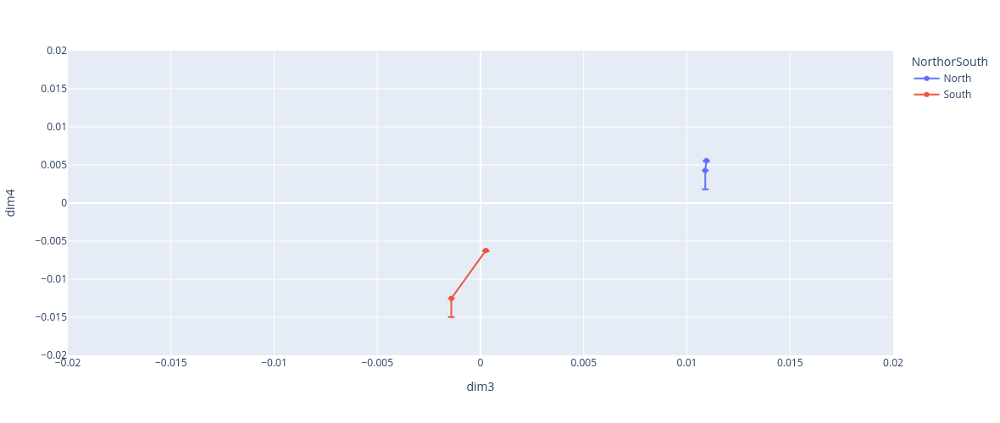

In [228]:
fig = px.line(summaries, x='dim3', y='dim4', 
              color='NorthorSouth', markers=True,
                hover_data=['NorthorSouth', 'EarlyorLate'],
             width=500, height=500)
fig.update_layout(yaxis_range=[-0.02,0.02])
fig.update_layout(xaxis_range=[-0.02,0.02])
fig.update_traces(error_y={
    "type": "data",
    "symmetric": False,
    "array": comb_df['dim4_95'] - comb_df['dim4'],
    "arrayminus": summaries['dim4'] - Qdf_below['dim4_5']
})
fig.show()

Plot the $P$ resamples of the mean positions of A_North, A_South, B_North, B_South (so $4P$ points) where we are under the null hypothesis to see where these mean positions are when we *don't* care about time. Then we plot the 4 points where we *do* care about time.

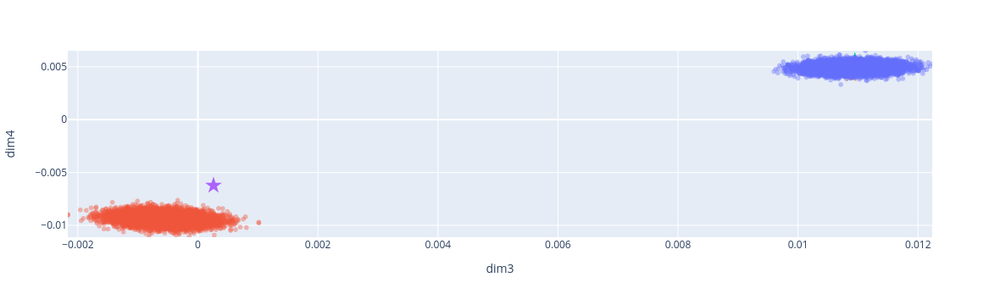

In [229]:
fig = px.scatter(summariesdf, x="dim3", y="dim4",
                color="NorthorSouth",opacity=0.4,
                hover_data=["NorthorSouth","permutation", "AorB"])
fig.update_layout(showlegend=False)
fig.update_xaxes(range = [min(summariesdf["dim3"]), max(summariesdf["dim3"])] )
fig.update_yaxes(range = [min(summariesdf["dim4"]), max(summariesdf["dim4"])] )
fig.update_traces(textposition="top center")

fig.add_trace(go.Scatter(x =[ (summaries.loc['earlyNorth', 'dim3'])], y = [(summaries.loc['earlyNorth', 'dim4'])], mode = 'markers',
   marker_symbol = 'star',
   hovertext=["earlyNorth"],
   marker_size = 15))

fig.add_trace(go.Scatter(x =[ (summaries.loc['earlySouth', 'dim3'])], y = [(summaries.loc['earlySouth', 'dim4'])], mode = 'markers',
   marker_symbol = 'star',
    hovertext=["earlySouth"],
    marker_size = 15))
fig.add_trace(go.Scatter(x =[ (summaries.loc['lateNorth', 'dim3'])], y = [(summaries.loc['lateNorth', 'dim4'])], mode = 'markers',
   marker_symbol = 'star',
    hovertext=['lateNorth'],
   marker_size = 15))
fig.add_trace(go.Scatter(x =[ (summaries.loc['lateSouth', 'dim3'])], y = [(summaries.loc['lateSouth', 'dim4'])], mode = 'markers',
   marker_symbol = 'star',
    hovertext=['lateSouth'],
   marker_size = 15))

fig.show()

# 07/10/2022 Stuff - Hope this is right! see paper notebook too

In [230]:
lowerQs = []
for i in range(4):
    TEMP = T_PC_p_table_squared.iloc[:,i].quantile(q=[0.05])
    lowerQs.append(TEMP)
    
upperQs = []
for i in range(4):
    TEMP = T_PC_p_table_squared.iloc[:,i].quantile(q=[0.95])
    upperQs.append(TEMP)

In [231]:
lowerQdf = pd.DataFrame(lowerQs)
upperQdf = pd.DataFrame(upperQs)

In [232]:
Qdf = pd.concat([lowerQdf, upperQdf],axis=1)

In [233]:
T_PC_squared = pd.DataFrame(T_PC**2, index=['dim1','dim2','dim3','dim4'])
T_PC_squared.columns=(['TimeMatters'])

In [234]:
Qdf = pd.concat([Qdf, T_PC_squared], axis=1)

In [235]:
Qdf

,0.05,0.95,TimeMatters
dim1,2.833679,2760.081259,1307.214140
dim2,7.602582,8409.059569,3190.950060
dim3,5.338818,5993.094753,2954.902677
dim4,5.848924,5587.503992,26531.573187


In [236]:
Qdf.to_csv('CIplottingdf_take2_UK.csv')

In [237]:
df.head(2)

,dim1,dim2,dim3,dim4,year,Xscaled,Yscaled,LAD,col,index,LAD11CD,RGN11CD,RGN11NM,NorthIndicator,EarlyIndicator,A_indicator
0,-0.105363,0.122562,-0.114425,0.000447,2005,0.801441,0.145821,Westminster,#CC3325,179,E09000033,E12000007,London,0,1,0
1,-0.073963,0.052386,-0.028679,0.033804,2005,0.811587,0.142026,Southwark,#CF3324,321,E09000028,E12000007,London,0,1,0


## Average per year movements of the North and South -- 17/10/2022

In [238]:
yearOnYear = []

for year in range(2005,2011):
    data = df[df['year'] == year]
    dataN = data[data['NorthIndicator']==0]
    dataS = data[data['NorthIndicator']==1]
    avgN = [np.mean(dataN['dim1']), np.mean(dataN['dim2']), np.mean(dataN['dim3']), np.mean(dataN['dim4']), "North" , year]
    avgS = [np.mean(dataS['dim1']), np.mean(dataS['dim2']), np.mean(dataS['dim3']), np.mean(dataS['dim4']), "South" , year]
    
    yearOnYear.append(avgN)
    yearOnYear.append(avgS)


In [239]:
yearOnYear = pd.DataFrame(yearOnYear, columns=['dim1', 'dim2', 'dim3', 'dim4', 'NorS', 'year'])

In [240]:
yearOnYear

,dim1,dim2,dim3,dim4,NorS,year
0,-0.023786,-0.008388,-0.001821,-0.004944,North,2005
1,-0.018467,0.003374,0.010728,0.007443,South,2005
2,-0.013924,-0.009993,0.000751,-0.005179,North,2006
3,-0.010809,-0.000451,0.009399,0.004158,South,2006
4,-0.016571,-0.012236,0.001850,-0.008569,North,2007
5,-0.011607,-0.003472,0.012716,0.005116,South,2007
6,-0.027319,-0.012329,-0.000963,-0.015151,North,2008
7,-0.019259,0.001601,0.016576,0.005911,South,2008
8,-0.009559,-0.007548,-0.000056,-0.006456,North,2009
9,-0.006494,0.001732,0.005182,0.003431,South,2009


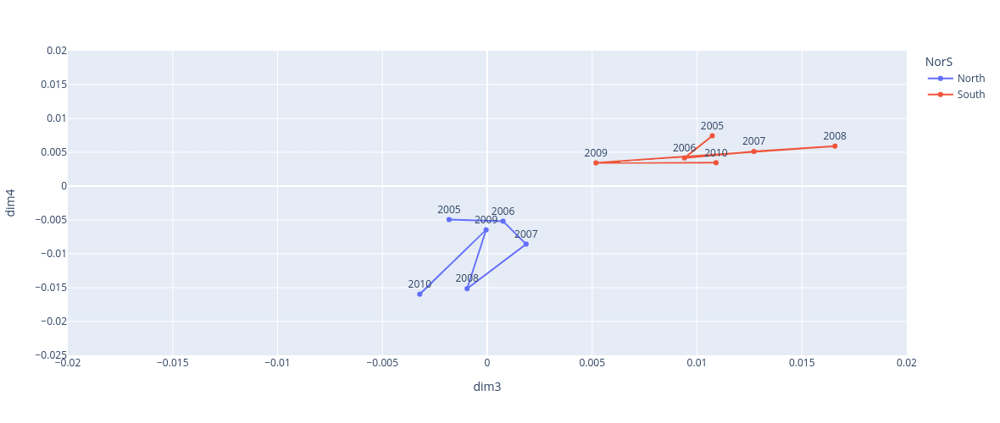

[48521:0106/113059.423269:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [241]:
fig = px.line(yearOnYear, x='dim3', y='dim4', 
              color='NorS', markers=True,
              text='year',
                hover_data=['NorS', 'year'],
             width=500, height=500)

fig.update_traces(textposition='top center')


fig.update_layout(yaxis_range=[-0.025,0.02])
fig.update_layout(xaxis_range=[-0.02,0.02])
fig.show()

fig.write_image('yearOnYear_Dim1_2_UK.pdf')

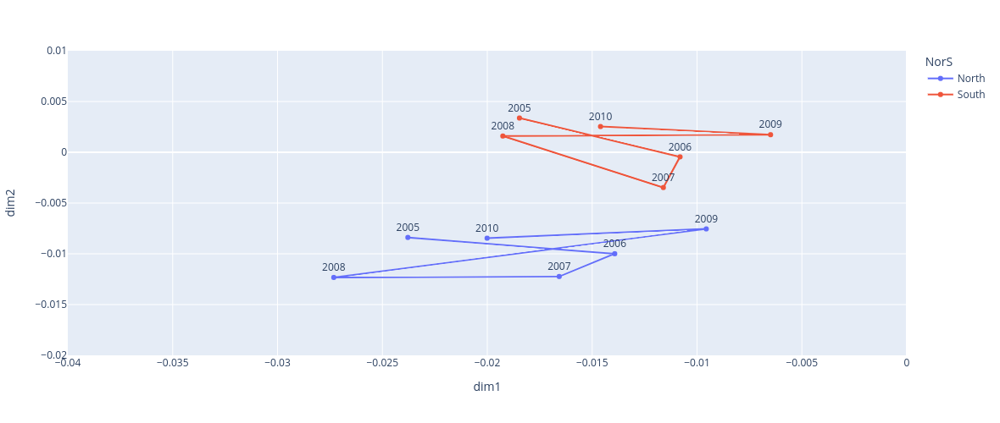

[48521:0106/113059.742619:ERROR:buffer_manager.cc(488)] [.DisplayCompositor]GL ERROR :GL_INVALID_OPERATION : glBufferData: <- error from previous GL command


In [242]:
fig = px.line(yearOnYear, x='dim1', y='dim2', 
              color='NorS', markers=True,
              text='year',
                hover_data=['NorS', 'year'],
             width=500, height=500)

fig.update_traces(textposition='top center')


fig.update_layout(yaxis_range=[-0.02,0.01])
fig.update_layout(xaxis_range=[-0.04,0])
fig.show()

fig.write_image('yearOnYear_Dim3_4_UK.pdf')

Plot for each year to see what North and South are doing over time. Trying to justify splitting into early/late and testing. 

/tmp/ipykernel_19580/2744036914.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/2744036914.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/2744036914.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/2744036914.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



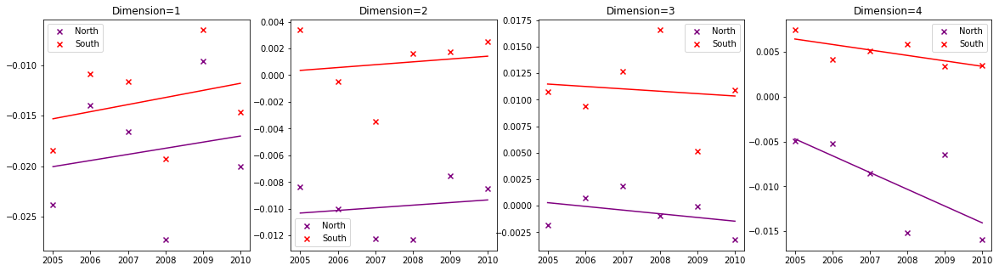

In [243]:
fig, axes = plt.subplots(1,4, figsize=(20,5))

for i, ax in enumerate(axes):
    ax.set_title(f'Dimension={1+i}')
    ax.set_xticks=(list(range(0,6)))
    ax.set_xticklabels(list(range(2004,2011)))
    N = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='North'])
    S = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='South'])
    years = range(2005,2011)
    ax.scatter(years, N, color="purple", label='North', marker='x') #plot North points
    a, b = np.polyfit(years, N, 1) # fit line of best fit
    ax.plot(years, a*years+b, color="purple") # add LoB to plot
    ax.scatter(years, S, color="red", label='South', marker='x')
    a, b = np.polyfit(years, S, 1)
    ax.plot(years, a*years+b, color="red") 
    ax.legend(loc="best")
    
plt.savefig('AverageValueYearOnYear_NS_perDimension_UK.pdf')

/tmp/ipykernel_19580/2004340642.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/2004340642.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/2004340642.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/2004340642.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



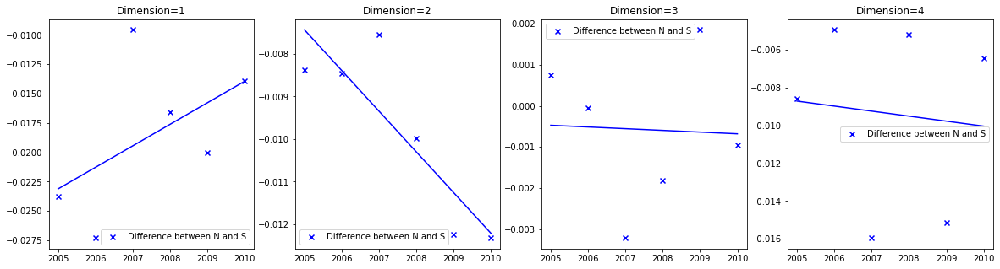

In [244]:
fig, axes = plt.subplots(1,4, figsize=(20,5))

for i, ax in enumerate(axes):
    ax.set_title(f'Dimension={1+i}')
    ax.set_xticks=(list(range(0,6)))
    ax.set_xticklabels(list(range(2004,2011)))
    N = set(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='North'])
    S = set(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='South'])
    diff = list(N-S)
    years = range(2005,2011)
    ax.scatter(years, diff, color="blue", label='Difference between N and S', marker='x') #plot diff
    a, b = np.polyfit(years, diff, 1) # fit line of best fit
    ax.plot(years, a*years+b, color="blue") # add LoB to plot 
    ax.legend(loc="best")
    
plt.savefig('AverageValueYearOnYear_diff_perDimension_UK.pdf')

# London or not London (UK)

In [245]:
df = pd.read_csv("animationDataUK.csv")

In [246]:
df = df.drop(columns=(["LAD1_2", "LAD3_4"]))

### Need to assign each LAD to either North or South

Use the region to say:
East of England, South West, South East, and London constitute 'South'.

In [247]:
LAD_Region_lookup = pd.read_csv("LAD_Region_lookup_UK.csv")

In [248]:
df = df.merge(LAD_Region_lookup, left_on="LAD", right_on="LAD11NM", how="left")

#### Change this so that what is "North" in the code now represents "London"

In [249]:
df["NorthIndicator"] = np.where( (df["RGN11NM"] == "London") , 1 ,0) 

In [250]:
df = df.rename(columns={"LAD_x": "LAD"})
df = df.drop(columns=(["LAD_y", "Unnamed: 0_x","Unnamed: 0_y", "LAD11NM"]))

In [251]:
# how many LADs are in the north
n = df[(df["year"]==2005) & (df["NorthIndicator"]==1)].shape[0]
# how many LADs are in the south
s = df[(df["year"]==2005) & (df["NorthIndicator"]==0)].shape[0]

print([n,s])

[33, 347]


In [252]:
d = 4 # we chose this from the scree plots

years = df["year"].unique()
earlyYears = years[0:3] # 2005-2007
lateYears = years[3:6]  # 2008-2010

In [253]:
mean_diff_early = []
mean_diff_late = []

In [254]:
# make a column that is 1 if the year is an "early year"
df["EarlyIndicator"] = np.where( (df["year"] == earlyYears[0]) | (df["year"] == earlyYears[1]) | (df["year"] == earlyYears[2]), 1, 0) 
earlyNorthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 1) ]
earlySouthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 0) ]
lateNorthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 1) ]
lateSouthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 0) ]

In [255]:
# calculate values of mean_diff_early_i for all i, i.e. all PCs, and store them in order in a vector
# same for mean_diff_late_i

for i in range(0,d):
    valEarly = (1/3*n) * sum( earlyNorthdf.iloc[: ,i])  -  (1/3*s) * sum( earlySouthdf.iloc[: ,i])
    valLate = (1/3*n) * sum( lateNorthdf.iloc[: ,i])  -  (1/3*s) * sum( lateSouthdf.iloc[: ,i])
    mean_diff_early.append(valEarly)
    mean_diff_late.append(valLate)

In [256]:
# calculate T_PC_i
T_PC = np.subtract(mean_diff_early, mean_diff_late)

# length d vector of the subtracted values
T_PC

array([ -52.10370448,  211.1459067 ,  -38.81602041, -448.9749333 ])

In [257]:
T_full_obs = sum(T_PC**2) # this is T_obs
T_obs = T_full_obs # incase I type wrong thing
T_full_obs

250382.56411114836

#### Permute assignments of LADs into before/after independently

If the null hypothesis says that time doesn't matter, the labelling of columns into positions shouldn't matter. So we can permute the assignments.
Each LAD is counted exactly 3 times in the early/late groups, which we might label A and B when permuting to avoid confusion. Which groups the LADs columns are assigned to are done **independently** for each LAD.

In [258]:
ladslist = pd.read_csv("LADS_list_UK.csv", header=None)

ladslist = ladslist[1]
ladslist = list(ladslist)
ladslist = ladslist[1:] # removes a 0 as the first list entry
len(ladslist)

380

#### Put it all together in a loop that iterates P times, and stores P items in a `T_full_p_list` item. 

In [259]:
rand_ones = np.array([0,0,0,1,1,1])
df["A_indicator"] = 0

T_full_p_list = []
P = 5000

# for the individual PCs
T_PC_p_table = pd.DataFrame(columns=['dim1','dim2','dim3','dim4'])

The cell below takes ~5mins to run when $p=5000$.

In [260]:
summariesdf = pd.DataFrame()


for p in range(P):

    for lad in ladslist:
        # to pick 3 timepoints at random for group A
        random.shuffle(rand_ones)
        # populates the "A_indicator" column
        df.loc[df["LAD"] == lad,"A_indicator"] = rand_ones

# split the data into the 4 groups (made up of 2 binary labels, 2*2 = 4)
    A_Northdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 1) ]
    A_Southdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 0) ]
    B_Northdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 1) ]
    B_Southdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 0) ]
    
    ### THIS STUFF IS TO CONSTRUCT CONFIDENCE INTERVALS
    A_North_summaries = [np.mean(A_Northdf['dim1']) , np.mean(A_Northdf['dim2']) , np.mean(A_Northdf['dim3']) , np.mean(A_Northdf['dim4'])]
    A_South_summaries = [np.mean(A_Southdf['dim1']) , np.mean(A_Southdf['dim2']) , np.mean(A_Southdf['dim3']) , np.mean(A_Southdf['dim4'])]
    B_North_summaries = [np.mean(B_Northdf['dim1']) , np.mean(B_Northdf['dim2']) , np.mean(B_Northdf['dim3']) , np.mean(B_Northdf['dim4'])]
    B_South_summaries = [np.mean(B_Southdf['dim1']) , np.mean(B_Southdf['dim2']) , np.mean(B_Southdf['dim3']) , np.mean(B_Southdf['dim4'])]
    summaries = pd.DataFrame (A_North_summaries, columns = ['A_North'])
    summaries['A_South'] = A_South_summaries
    summaries['B_North'] = B_North_summaries
    summaries['B_South'] = B_South_summaries
    summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])
    summaries = summaries.transpose()
    summaries['NorthIndicator'] = [1,0,1,0]
    summaries['NorthorSouth'] = np.where(summaries['NorthIndicator'] >0, 'North', 'South')
    summaries['A_Indicator'] = [1,1,0,0]
    summaries['AorB'] = np.where(summaries['A_Indicator'] >0, 'A', 'B')
    summaries['permutation'] = p
    summariesdf = pd.concat([summariesdf, summaries], axis=0)


    # length d vectors of the difference between the mean locations of the North and South for the 2 groups, A and B 
    mean_diff_A_p = []  #A is early, B is late
    mean_diff_B_p = []
    # calculate values of mean_diff_A_i for all i, i.e. all PCs, and store them in order in a vector
    # same for mean_diff_B_i
    for i in range(0,d):
        valA = (1/3*n) * sum( A_Northdf.iloc[: ,i])  -  (1/3*s) * sum( A_Southdf.iloc[: ,i])
        valB = (1/3*n) * sum( B_Northdf.iloc[: ,i])  -  (1/3*s) * sum( B_Southdf.iloc[: ,i])
        mean_diff_A_p.append(valA)
        mean_diff_B_p.append(valB)

    # calculate T_PC_i_p
    T_PC_p = np.subtract(mean_diff_A_p, mean_diff_B_p)

    T_full_p = sum(T_PC_p**2) # this is T_obs

    # values for all dimensions statistic 
    T_full_p_list.append(T_full_p)
    
    # values for individual dimension statistic
    T_PC_p_table.loc[p,:] = T_PC_p

In [261]:
counter = 0
for p in range(P):
    if T_full_p_list[p] > T_obs:
        counter += 1
    else: 
        counter = counter

In [262]:
# how many of the P permutations had a distance larger than T_obs
counter

0

p-value for testing change across all dimensions:

In [263]:
# because we consider:
# p-value = (1/(P+1)) #test statistics >= T_obs 
# where T_obs and T_p are all considered.
(counter+1)/(P+1)

0.0001999600079984003

In [264]:
# plt.hist(T_full_p_list, bins=20)
# plt.axvline(T_obs,color='red')

This is across all d=4 embedding dimensions. We should split this out now to have 4 T_obs, one for each PC, and then get P replicates of T_PC_i

#### Testing if time matters in each of the 4 dimensions independently
I think we can do this as the dimensions are orthogonal

In [265]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table.iloc[p , dim] > T_PC[dim]:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value
PC_p_values

[0.882623475304939, 0.004199160167966407, 0.7088582283543291, 1.0]

In [266]:
# can square all the values in the `T_PC_p_table` table.
# This is to say we are looking at the value of   (mean_diff_A_p_i - mean_diff_B_p_i)**2
# when we look at row p, column i in the table

T_PC_p_table_squared = T_PC_p_table**2 # #square every value in df

Histograms for *mean_diff_A_p_i - mean_diff_B_p_i*, where there is a plot for each `i` (the dimension), and `P` counts. 

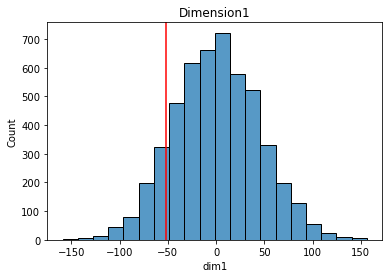

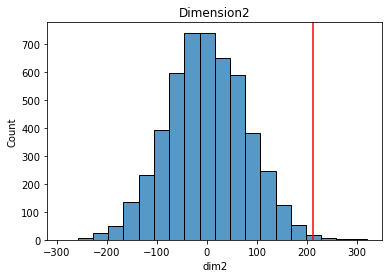

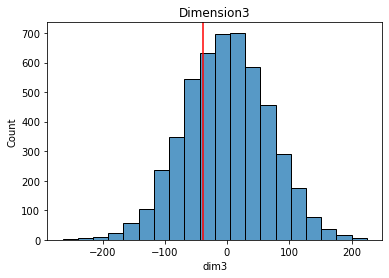

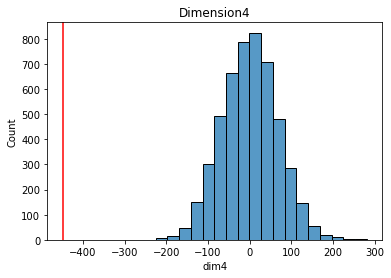

In [267]:
for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table.iloc[:,dim], bins=20)
    plt.axvline(T_PC[dim], color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

### Histograms for *(mean_diff_A_p_i - mean_diff_B_p_i)$^2$*, where there is a plot for each `i` (the dimension), and `P` counts. 

In [268]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table_squared.iloc[p , dim] > (T_PC[dim])**2:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_square_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value

# p-values for each dimension
PC_p_square_values

[0.2393521295740852,
 0.007598480303939212,
 0.5690861827634474,
 0.0001999600079984003]

Tells us at the 5% significance level, we can see there are significant changes for PC2 and PC3 in that we see a change between the 
**early** years (2005-2007) and the **late** years (2008-2010). This is for *London-notLondon*

For N/S divide stuff we saw significance in PC4.

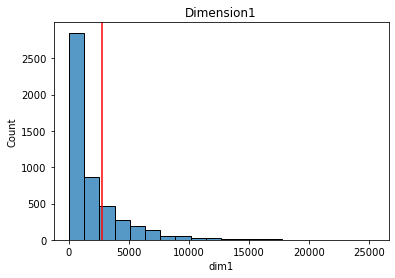

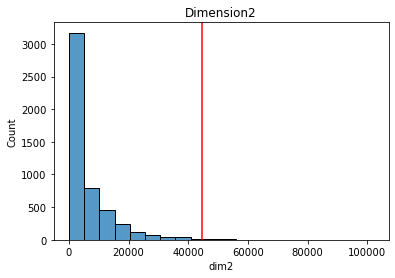

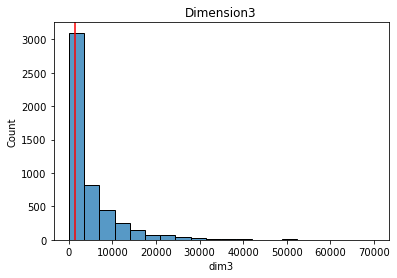

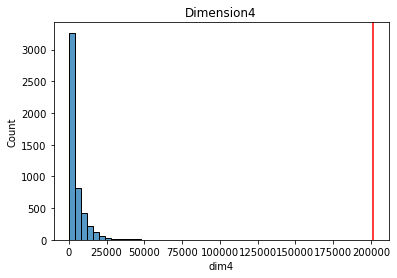

In [269]:
# squared values of distance between mean diff in groups A and B

for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table_squared.iloc[:,dim], bins=20)
    plt.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

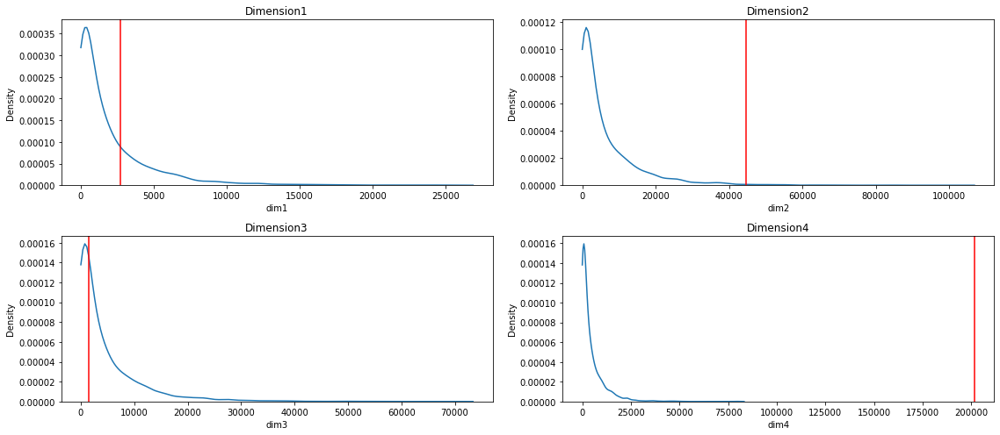

In [270]:
fig, axes = plt.subplots(2,2, figsize=(16,7))

for dim, ax in enumerate(axes.ravel()):
    sns.kdeplot(T_PC_p_table_squared.iloc[:,dim] , clip=(0.0, 2500000), ax=ax)
    ax.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
fig.tight_layout()    


### Plots and Summary Statistics
06/10/2022

In [271]:
earlyNorth_summaries = [np.mean(earlyNorthdf['dim1']) , np.mean(earlyNorthdf['dim2']) , np.mean(earlyNorthdf['dim3']) , np.mean(earlyNorthdf['dim4'])]
earlySouth_summaries = [np.mean(earlySouthdf['dim1']) , np.mean(earlySouthdf['dim2']) , np.mean(earlySouthdf['dim3']) , np.mean(earlySouthdf['dim4'])]
lateNorth_summaries = [np.mean(lateNorthdf['dim1']) , np.mean(lateNorthdf['dim2']) , np.mean(lateNorthdf['dim3']) , np.mean(lateNorthdf['dim4'])]
lateSouth_summaries = [np.mean(lateSouthdf['dim1']) , np.mean(lateSouthdf['dim2']) , np.mean(lateSouthdf['dim3']) , np.mean(lateSouthdf['dim4'])]

In [272]:
summaries = pd.DataFrame (earlyNorth_summaries, columns = ['earlyNorth'])
summaries['earlySouth'] = earlySouth_summaries
summaries['lateNorth'] = lateNorth_summaries
summaries['lateSouth'] = lateSouth_summaries

summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])

summaries = summaries.transpose()

summaries['NorthIndicator'] = [1,0,1,0]
summaries['LondonorNot'] = np.where(summaries['NorthIndicator'] >0, 'London', 'notLondon')
summaries['EarlyIndicator'] = [1,1,0,0]
summaries['EarlyorLate'] = np.where(summaries['EarlyIndicator'] >0, 'Early', 'Late')

In [273]:
summariesdf['ABNorthSouth'] = summariesdf['NorthorSouth'] + summariesdf['AorB'] 

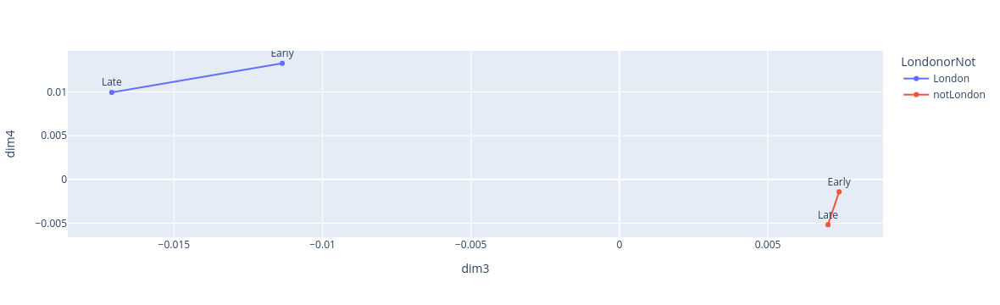

In [274]:
# fig1 = px.scatter(summariesdf, x="dim3", y="dim4",
#                  color ="ABNorthSouth", opacity=0.2,
#                  height=500, width=500)

fig2 = px.line(summaries, x='dim3', y='dim4', 
              color='LondonorNot', markers=True,
              text='EarlyorLate',
                hover_data=['LondonorNot', 'EarlyorLate'])

fig2.update_traces(textposition='top center')


# fig3 = go.Figure(data=fig2.data + fig1.data)
# fig3.update_xaxes(range = [max(summariesdf["dim3"])+0.005, min(summariesdf["dim3"])-0.005] )
# fig3.update_yaxes(range = [max(summariesdf["dim4"])+0.003, min(summariesdf["dim4"])-0.005 ])
# fig3.show()

fig2.show()

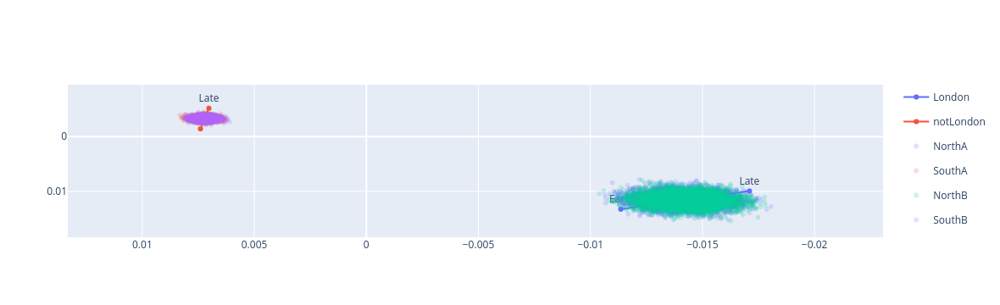

In [275]:
fig1 = px.scatter(summariesdf, x="dim3", y="dim4",
                 color ="ABNorthSouth", opacity=0.2,
                 height=500, width=500)

fig2 = px.line(summaries, x='dim3', y='dim4', 
              color='LondonorNot', markers=True,
              text='EarlyorLate',
                hover_data=['LondonorNot', 'EarlyorLate'])

fig2.update_traces(textposition='top center')


fig3 = go.Figure(data=fig2.data + fig1.data)
fig3.update_xaxes(range = [max(summariesdf["dim3"])+0.005, min(summariesdf["dim3"])-0.005] )
fig3.update_yaxes(range = [max(summariesdf["dim4"])+0.003, min(summariesdf["dim4"])-0.005 ])
fig3.show()

#fig2.show()

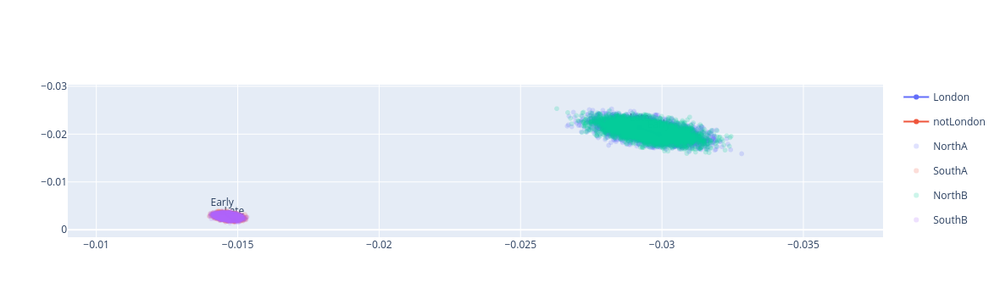

In [276]:
fig1 = px.scatter(summariesdf, x="dim1", y="dim2",
                 color ="ABNorthSouth", opacity=0.2,
                 height=500, width=500)

fig2 = px.line(summaries, x='dim1', y='dim2', 
              color='LondonorNot', markers=True,
              text='EarlyorLate',
                hover_data=['LondonorNot', 'EarlyorLate'])

fig2.update_traces(textposition='top center')


fig3 = go.Figure(data=fig2.data + fig1.data)
fig3.update_xaxes(range = [max(summariesdf["dim1"])+0.005, min(summariesdf["dim1"])-0.005] )
fig3.update_yaxes(range = [max(summariesdf["dim2"])+0.003, min(summariesdf["dim2"])-0.005 ])
fig3.show()


## Average per year movements of the London and not London 
-- 05/12/2022

In [277]:
yearOnYear = []

for year in range(2005,2011):
    data = df[df['year'] == year]
    dataN = data[data['NorthIndicator']==0]
    dataS = data[data['NorthIndicator']==1]
    avgN = [np.mean(dataN['dim1']), np.mean(dataN['dim2']), np.mean(dataN['dim3']), np.mean(dataN['dim4']), "North" , year]
    avgS = [np.mean(dataS['dim1']), np.mean(dataS['dim2']), np.mean(dataS['dim3']), np.mean(dataS['dim4']), "South" , year]
    
    yearOnYear.append(avgN)
    yearOnYear.append(avgS)

In [278]:
yearOnYear = pd.DataFrame(yearOnYear, columns=['dim1', 'dim2', 'dim3', 'dim4', 'NorS', 'year'])

Plot for each year to see what North and South are doing over time. Trying to justify splitting into early/late and testing. 

/tmp/ipykernel_19580/3113838516.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/3113838516.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/3113838516.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/3113838516.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



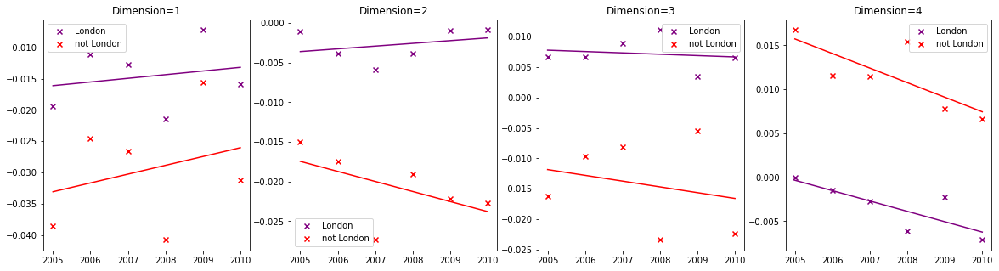

In [279]:
fig, axes = plt.subplots(1,4, figsize=(20,5))

for i, ax in enumerate(axes):
    ax.set_title(f'Dimension={1+i}')
    ax.set_xticks=(list(range(0,6)))
    ax.set_xticklabels(list(range(2004,2011)))
    N = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='North'])
    S = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='South'])
    years = range(2005,2011)
    ax.scatter(years, N, color="purple", label='London', marker='x') #plot London points
    a, b = np.polyfit(years, N, 1) # fit line of best fit
    ax.plot(years, a*years+b, color="purple") # add LoB to plot
    ax.scatter(years, S, color="red", label='not London', marker='x')
    a, b = np.polyfit(years, S, 1)
    ax.plot(years, a*years+b, color="red") 
    ax.legend(loc="best")
    
plt.savefig('AverageValueYearOnYear_London_notLondon_perDimension_UK.pdf')

# Urban-Rural Classification

In [280]:
RUC = pd.read_csv("RUC_LAD_2011_EN_LU.csv")

In [281]:
df = pd.read_csv("animationDataUK.csv")

In [282]:
df = df.drop(columns=(["LAD1_2", "LAD3_4"]))

In [283]:
# Include this still so df has a LAD11CD to match with the RUC file
df = df.merge(LAD_Region_lookup, left_on="LAD", right_on="LAD11NM", how="left")

### Need to assign each LAD to either Rural or Urban
#### At LAD level there is no U-R classification for LADs in Wales, only England
Use the region to say:


In [284]:
df = df.merge(RUC, left_on="LAD11CD", right_on="LAD11CD", how="left")

In [285]:
df = df.drop(columns=(['LAD_y', 'Unnamed: 0_x','Unnamed: 0_y', 'LAD18NM', 'Urban City and Town population 2011', 'Total Rural population 2011', 'LAD18CD','Urban Minor Conurbation population 2011', 'Rural including hub towns (rural & rural related) population as % of Total population 2011', 'Rural including hub towns (rural & rural related) population 2011', 'Hub towns (rural related) population included in Urban population 2011' ,'Urban Major Conurbation population 2011', 'Total Urban population 2011', 'Total population 2011' ]))

In [286]:
# all of the Welsh LADs
#df[(df['RUC11'].isna()) & (df['year']==2005) ]

### Change this so that what is "North" in the code now represents "Urban"
#### all of Wales in classed as Rural, apart from **Cardiff, Newport**, and **Swansea**, as we don't know how to assign it
We use this document which suggests Cardiff, Swansea, and Newport are the urban authorities in Wales.
https://gov.wales/sites/default/files/statistics-and-research/2018-12/080515-statistical-focus-rural-wales-08-en.pdf

In [287]:
#df['UrbanIndicator'] = np.where(df['RUC11CD'] > 4 , 1, 0)
df["NorthIndicator"] = np.where( (df['RUC11CD'] > 4) | (df['LAD_x']=="Swansea") | (df['LAD_x']=="Cardiff") |(df['LAD_x']=="Newport") , 1 ,0) 

### Scotland Urban/Rural LAD classification
Based on 8-fold population classification table from: https://www.gov.scot/publications/scottish-government-urban-rural-classification-2016/pages/5/

In [288]:
scot = pd.read_csv("Scotland_2016_LAD_population8fold_UR_classifications.csv")

In [289]:
scot["sum1_2"] = scot['Large Urban Areas'] + scot['Other Urban Areas']
# I define "urban" as the top 2 out of 8 urban classifiers

In [290]:
scot2 = scot[["Local Authority", "sum1_2"]]

In [291]:
df = df.merge(scot2, left_on="LAD_x", right_on="Local Authority", how="left")

In [292]:
df["NorthIndicator"] = np.where( (df['RUC11CD'] > 4) | (df['sum1_2'] >= 90.0) | (df['LAD_x']=="Swansea") | (df['LAD_x']=="Cardiff") |(df['LAD_x']=="Newport") , 1 ,0) 
# has to have all conditions, for Scotland, 

In [293]:
df = df.rename(columns={"LAD_x": "LAD"})

In [294]:
# check there are no rows with NA for the NorthIndicator

# df[df["NorthIndicator"].isna()]

In [295]:
# how many LADs are in the north
n = df[(df["year"]==2005) & (df["NorthIndicator"]==1)].shape[0]
# how many LADs are in the south
s = df[(df["year"]==2005) & (df["NorthIndicator"]==0)].shape[0]

print([n,s])

[92, 288]


In [296]:
d = 4 # we chose this from the scree plots

years = df["year"].unique()
earlyYears = years[0:3] # 2005-2007
lateYears = years[3:6]  # 2008-2010

In [297]:
mean_diff_early = []
mean_diff_late = []

In [298]:
# make a column that is 1 if the year is an "early year"
df["EarlyIndicator"] = np.where( (df["year"] == earlyYears[0]) | (df["year"] == earlyYears[1]) | (df["year"] == earlyYears[2]), 1, 0) 
earlyNorthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 1) ]
earlySouthdf = df[ (df["EarlyIndicator"] == 1) & (df["NorthIndicator"] == 0) ]
lateNorthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 1) ]
lateSouthdf = df[ (df["EarlyIndicator"] == 0) & (df["NorthIndicator"] == 0) ]

In [299]:
# calculate values of mean_diff_early_i for all i, i.e. all PCs, and store them in order in a vector
# same for mean_diff_late_i

for i in range(0,d):
    valEarly = (1/3*n) * sum( earlyNorthdf.iloc[: ,i])  -  (1/3*s) * sum( earlySouthdf.iloc[: ,i])
    valLate = (1/3*n) * sum( lateNorthdf.iloc[: ,i])  -  (1/3*s) * sum( lateSouthdf.iloc[: ,i])
    mean_diff_early.append(valEarly)
    mean_diff_late.append(valLate)

In [300]:
# calculate T_PC_i
T_PC = np.subtract(mean_diff_early, mean_diff_late)

# length d vector of the subtracted values
T_PC

array([ -32.91296852,  112.74935969,   43.91525395, -277.6843973 ])

In [301]:
T_full_obs = sum(T_PC**2) # this is T_obs
T_obs = T_full_obs # incase I type wrong thing
T_full_obs

92832.8556415621

#### Permute assignments of LADs into before/after independently

If the null hypothesis says that time doesn't matter, the labelling of columns into positions shouldn't matter. So we can permute the assignments.
Each LAD is counted exactly 3 times in the early/late groups, which we might label A and B when permuting to avoid confusion. Which groups the LADs columns are assigned to are done **independently** for each LAD.

In [302]:
ladslist = pd.read_csv("LADS_list_UK.csv", header=None)

ladslist = ladslist[1]
ladslist = list(ladslist)
ladslist = ladslist[1:] # removes a 0 as the first list entry
len(ladslist)

380

#### Put it all together in a loop that iterates P times, and stores P items in a `T_full_p_list` item. 

In [303]:
rand_ones = np.array([0,0,0,1,1,1])
df["A_indicator"] = 0

T_full_p_list = []
P = 5000

# for the individual PCs
T_PC_p_table = pd.DataFrame(columns=['dim1','dim2','dim3','dim4'])

The cell below takes ~5mins to run when $p=5000$.

In [304]:
summariesdf = pd.DataFrame()


for p in range(P):

    for lad in ladslist:
        # to pick 3 timepoints at random for group A
        random.shuffle(rand_ones)
        # populates the "A_indicator" column
        df.loc[df["LAD"] == lad,"A_indicator"] = rand_ones

# split the data into the 4 groups (made up of 2 binary labels, 2*2 = 4)
    A_Northdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 1) ]
    A_Southdf = df[ (df["A_indicator"] == 1) & (df["NorthIndicator"] == 0) ]
    B_Northdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 1) ]
    B_Southdf = df[ (df["A_indicator"] == 0) & (df["NorthIndicator"] == 0) ]
    
    ### THIS STUFF IS TO CONSTRUCT CONFIDENCE INTERVALS
    A_North_summaries = [np.mean(A_Northdf['dim1']) , np.mean(A_Northdf['dim2']) , np.mean(A_Northdf['dim3']) , np.mean(A_Northdf['dim4'])]
    A_South_summaries = [np.mean(A_Southdf['dim1']) , np.mean(A_Southdf['dim2']) , np.mean(A_Southdf['dim3']) , np.mean(A_Southdf['dim4'])]
    B_North_summaries = [np.mean(B_Northdf['dim1']) , np.mean(B_Northdf['dim2']) , np.mean(B_Northdf['dim3']) , np.mean(B_Northdf['dim4'])]
    B_South_summaries = [np.mean(B_Southdf['dim1']) , np.mean(B_Southdf['dim2']) , np.mean(B_Southdf['dim3']) , np.mean(B_Southdf['dim4'])]
    summaries = pd.DataFrame (A_North_summaries, columns = ['A_North'])
    summaries['A_South'] = A_South_summaries
    summaries['B_North'] = B_North_summaries
    summaries['B_South'] = B_South_summaries
    summaries.index = (['dim1', 'dim2' , 'dim3', 'dim4'])
    summaries = summaries.transpose()
    summaries['NorthIndicator'] = [1,0,1,0]
    summaries['NorthorSouth'] = np.where(summaries['NorthIndicator'] >0, 'North', 'South')
    summaries['A_Indicator'] = [1,1,0,0]
    summaries['AorB'] = np.where(summaries['A_Indicator'] >0, 'A', 'B')
    summaries['permutation'] = p
    summariesdf = pd.concat([summariesdf, summaries], axis=0)


    # length d vectors of the difference between the mean locations of the North and South for the 2 groups, A and B 
    mean_diff_A_p = []  #A is early, B is late
    mean_diff_B_p = []
    # calculate values of mean_diff_A_i for all i, i.e. all PCs, and store them in order in a vector
    # same for mean_diff_B_i
    for i in range(0,d):
        valA = (1/3*n) * sum( A_Northdf.iloc[: ,i])  -  (1/3*s) * sum( A_Southdf.iloc[: ,i])
        valB = (1/3*n) * sum( B_Northdf.iloc[: ,i])  -  (1/3*s) * sum( B_Southdf.iloc[: ,i])
        mean_diff_A_p.append(valA)
        mean_diff_B_p.append(valB)

    # calculate T_PC_i_p
    T_PC_p = np.subtract(mean_diff_A_p, mean_diff_B_p)

    T_full_p = sum(T_PC_p**2) # this is T_obs

    # values for all dimensions statistic 
    T_full_p_list.append(T_full_p)
    
    # values for individual dimension statistic
    T_PC_p_table.loc[p,:] = T_PC_p

In [305]:
counter = 0
for p in range(P):
    if T_full_p_list[p] > T_obs:
        counter += 1
    else: 
        counter = counter

In [306]:
# how many of the P permutations had a distance larger than T_obs
counter

0

p-value for testing change across all dimensions:

In [307]:
# because we consider:
# p-value = (1/(P+1)) #test statistics >= T_obs 
# where T_obs and T_p are all considered.
(counter+1)/(P+1)

0.0001999600079984003

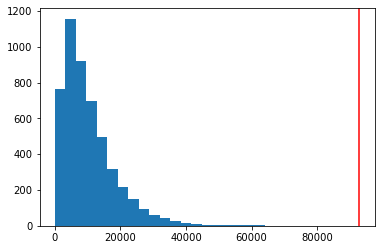

In [308]:
plt.hist(T_full_p_list, bins=20)
plt.axvline(T_obs,color='red')

This is across all d=4 embedding dimensions. We should split this out now to have 4 T_obs, one for each PC, and then get P replicates of T_PC_i

#### Testing if time matters in each of the 4 dimensions independently
I think we can do this as the dimensions are orthogonal

In [309]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table.iloc[p , dim] > T_PC[dim]:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value
PC_p_values

[0.8370325934813038, 0.038592281543691265, 0.19896020795840832, 1.0]

In [310]:
# can square all the values in the `T_PC_p_table` table.
# This is to say we are looking at the value of   (mean_diff_A_p_i - mean_diff_B_p_i)**2
# when we look at row p, column i in the table

T_PC_p_table_squared = T_PC_p_table**2 # #square every value in df

Histograms for *mean_diff_A_p_i - mean_diff_B_p_i*, where there is a plot for each `i` (the dimension), and `P` counts. 

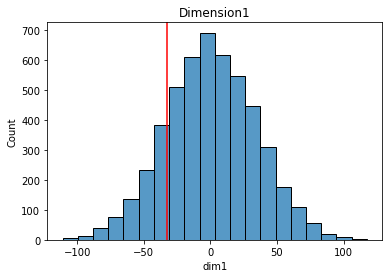

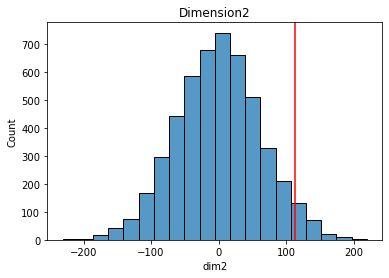

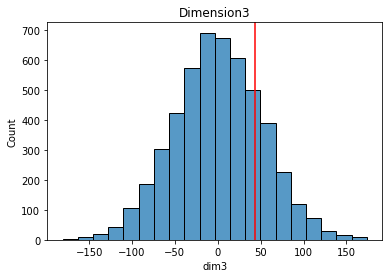

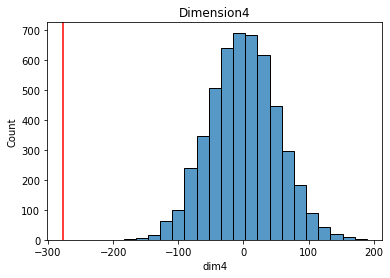

In [311]:
for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table.iloc[:,dim], bins=20)
    plt.axvline(T_PC[dim], color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

### Histograms for *(mean_diff_A_p_i - mean_diff_B_p_i)$^2$*, where there is a plot for each `i` (the dimension), and `P` counts. 

In [312]:
counters_PCs = []
for dim in range(d):
    counter = 0
    for p in range(P):
        if T_PC_p_table_squared.iloc[p , dim] > (T_PC[dim])**2:
            counter += 1
        else: 
            counter = counter
    counters_PCs.append(counter)

PC_p_square_values = [(x+1) / (P+1) for x in counters_PCs] # (x+1) add 1 as include the observed value

# p-values for each dimension
PC_p_square_values

[0.3313337332533493,
 0.07258548290341932,
 0.3899220155968806,
 0.0001999600079984003]

Tells us at the 2.5% significance level, we can see that only a significant change for PC3 in that we see a change between the 
**early** years (2005-2007) and the **late** years (2008-2010). This is for Urban-Rural status.

As Wales is not well-defined, it seems a bit difficult to trust this. 


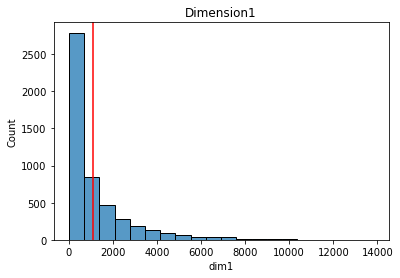

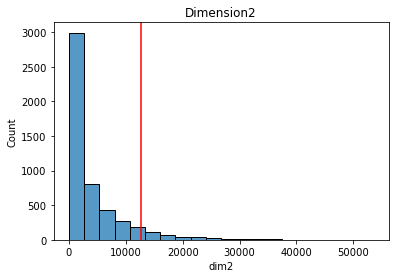

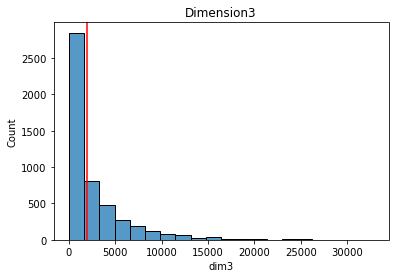

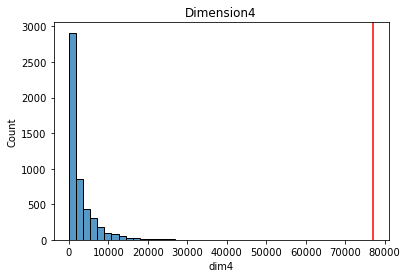

In [313]:
# squared values of distance between mean diff in groups A and B

for dim in range(d):
    f, ax = plt.subplots()
    ax = sns.histplot(T_PC_p_table_squared.iloc[:,dim], bins=20)
    plt.axvline( (T_PC[dim])**2 , color="red")
    ax.set_title("Dimension{}".format(dim+1))
    
    fig = ax.get_figure()

In [314]:
urbanAllLondonCheck = df[(df["RGN11NM"]=="London" ) & (df['year']==2005) ]
#urbanAllLondonCheck
# all LADs in London are urban

## Average per year movements of the Urban/Rural
-- 05/12/2022

In [315]:
yearOnYear = []

for year in range(2005,2011):
    data = df[df['year'] == year]
    dataN = data[data['NorthIndicator']==0]
    dataS = data[data['NorthIndicator']==1]
    avgN = [np.mean(dataN['dim1']), np.mean(dataN['dim2']), np.mean(dataN['dim3']), np.mean(dataN['dim4']), "North" , year]
    avgS = [np.mean(dataS['dim1']), np.mean(dataS['dim2']), np.mean(dataS['dim3']), np.mean(dataS['dim4']), "South" , year]
    
    yearOnYear.append(avgN)
    yearOnYear.append(avgS)

In [316]:
yearOnYear = pd.DataFrame(yearOnYear, columns=['dim1', 'dim2', 'dim3', 'dim4', 'NorS', 'year'])

Plot for each year to see what North and South are doing over time. Trying to justify splitting into early/late and testing. 

/tmp/ipykernel_19580/848584704.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/848584704.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/848584704.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator

/tmp/ipykernel_19580/848584704.py:6: UserWarning:

FixedFormatter should only be used together with FixedLocator



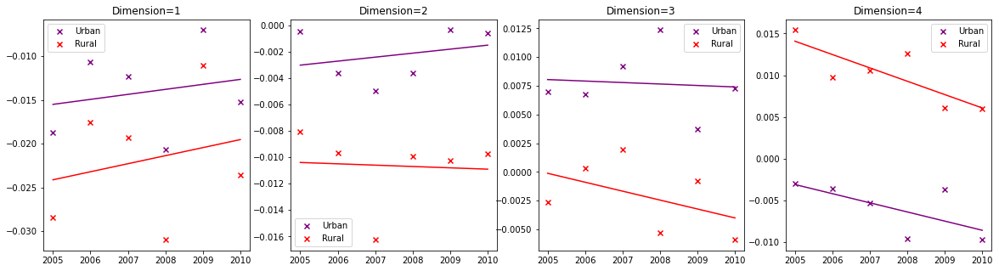

In [317]:
fig, axes = plt.subplots(1,4, figsize=(20,5))

for i, ax in enumerate(axes):
    ax.set_title(f'Dimension={1+i}')
    ax.set_xticks=(list(range(0,6)))
    ax.set_xticklabels(list(range(2004,2011)))
    N = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='North'])
    S = list(yearOnYear[f'dim{i+1}'][yearOnYear['NorS']=='South'])
    years = range(2005,2011)
    ax.scatter(years, N, color="purple", label='Urban', marker='x') #plot London points
    a, b = np.polyfit(years, N, 1) # fit line of best fit
    ax.plot(years, a*years+b, color="purple") # add LoB to plot
    ax.scatter(years, S, color="red", label='Rural', marker='x')
    a, b = np.polyfit(years, S, 1)
    ax.plot(years, a*years+b, color="red") 
    ax.legend(loc="best")
    
plt.savefig('AverageValueYearOnYear_UrbanRural_perDimension_UK.pdf')

# Summaries

* North/South - PC4 significant to time matters
* London/not London - PC2 & PC4
* Urban/Rural (badly defined) - PC4

Seems odd that PC4 has a p-value of 0 in all of these things.


In [318]:
df['RGN11NM'].unique()

array(['London', 'West Midlands', 'Yorkshire and The Humber', 'Scotland',
       'South West', 'South East', 'North West', 'North East',
       'East Midlands', 'Wales', 'East of England'], dtype=object)